#### About This Document
This document is part of the coursework for the QM Module (CASA0007) at UCL CASA. You can find the source code [here](https://nbviewer.org/github/burhanucl2023/QM_Assignment/blob/main/Urban_Heat_Island_London_QM_Final.ipynb) and the data associated [here](https://github.com/burhanucl2023/QM_Assignment/tree/main/data)

### What does this Code Do ?

This code analyzes the dynamics of the Urban Heat Island (UHI) effect in the wards of London, focusing on the influence of various built environment features. The document provides a comprehensive framework for performing multiple linear regression analysis to understand how different elements of the urban environment contribute to variations in the UHI across London.

**1. Data Used in this Code:**
   - **Final Dataset**: A comprehensive dataset that integrates Built Environment Data(Ward Level), and Spatial Data (Wards Level) & Mean Urban Heat Index Data of Wards (obtained from Google Earth Engine) obtained through data extraction, merging, and wrangling.

**2. Objectives of this Code:**
   - Perform Data Wrangling - As the names of wards were having mismatch, so the same was taken care of in the wrangling process and thus spatial data  was laigned with the built environment data for further obtaining the dependent varaible i.e (mean Urban Heat Index) for each ward from Google Earth Engine.
   - Perform Data Cleaning -  Handle missing values, standardize data types, and clean column names to prepare the dataset for analysis.
   - Perform Data Merging - Combine multiple datasets to create a final, comprehensive dataset suitable for analysis.
   - Perform Descriptive Statistics - Summarize and describe the data to gain initial insights into its distribution and characteristics
   - Perform Correlation Analysis - To identify significant relationship between variable's
   - Perform Multiple Linear Regression Analysis - To determine the impact of each built environment element on mean urban heat index.
   - Perform Variance Inflation Factor (VIF) - To check for multicollinearity among variable's
   - Perform Robustness Check of Regression Assumptions -  Using QQ Plots and residual analysis to validate the assumptions underlying the linear regression model.
     
**3. Answer these Questions:**
   - RQ1: How are various built environment features distributed across the different wards of London? 
   - RQ2: Do built environment feature have any influence on the Urban Heat Index of London Wards? 
   - RQ3: What is the impact each built environment feature have on Urban Heat Index of London Wards?

This document details the steps and code used, ensuring that the analysis is transparent and reproducible.

In [2]:
import pandas as pd
import geopandas as gpd
import re
from fuzzywuzzy import process
import folium
from folium.plugins import HeatMap
from branca.colormap import LinearColormap
import matplotlib.pyplot as plt
import seaborn as sns
import os
import statsmodels.api as sm

In [3]:
# pip install fuzzywuzzy[speedup] pandas
# pip install geopandas folium branca
# pip install geopandas folium branca ipywidgets

In [4]:
# Loading the Spatial Ward Data

# Get the current working directory
script_dir = os.getcwd()

# Construct the full path to the first shapefile
df_ward_path = os.path.join(script_dir, "data/London_Ward_CityMerged.shp")

# Load the shrid boundary shapefile into a GeoDataFrame
df_ward = gpd.read_file(df_ward_path)

In [5]:
df_ward

,NAME,GSS_CODE,HECTARES,NONLD_AREA,LB_GSS_CD,BOROUGH,POLY_ID,geometry
0,Chessington South,E05000405,755.173,0.000,E09000021,Kingston upon Thames,50840,"POLYGON ((516401.600 160201.800, 516407.300 16..."
1,Tolworth and Hook Rise,E05000414,259.464,0.000,E09000021,Kingston upon Thames,117160,"POLYGON ((517829.600 165447.100, 517837.100 16..."
2,Berrylands,E05000401,145.390,0.000,E09000021,Kingston upon Thames,50449,"POLYGON ((518107.500 167303.400, 518114.300 16..."
3,Alexandra,E05000400,268.506,0.000,E09000021,Kingston upon Thames,50456,"POLYGON ((520480.000 166909.800, 520490.700 16..."
4,Beverley,E05000402,187.821,0.000,E09000021,Kingston upon Thames,117161,"POLYGON ((522071.000 168144.900, 522063.900 16..."
...,...,...,...,...,...,...,...,...
620,Whalebone,E05000042,155.399,0.000,E09000002,Barking and Dagenham,117022,"POLYGON ((549410.700 187450.700, 549391.200 18..."
621,Eastbrook,E05000030,345.060,0.000,E09000002,Barking and Dagenham,50856,"POLYGON ((549991.500 184928.500, 549988.900 18..."
622,Chadwell Heath,E05000029,338.422,0.000,E09000002,Barking and Dagenham,117014,"POLYGON ((547715.200 187914.200, 547712.500 18..."
623,Parsloes,E05000037,124.384,0.000,E09000002,Barking and Dagenham,117017,"POLYGON ((547381.600 185753.600, 547377.500 18..."


In [6]:
# Finding unique borough names
unique_boroughs = df_ward['BOROUGH'].unique()

# Counting the number of unique boroughs
unique_borough_count = df_ward['BOROUGH'].nunique()

# Display the unique borough names and their count
print("Unique Borough Names:")
print(unique_boroughs)
print("\nCount of Unique Borough Names:")
print(unique_borough_count)

Unique Borough Names:
['Kingston upon Thames' 'Croydon' 'Bromley' 'Hounslow' 'Ealing' 'Havering'
 'Hillingdon' 'Harrow' 'Brent' 'Barnet' 'Lambeth' 'Southwark' 'Lewisham'
 'Greenwich' 'Bexley' 'Enfield' 'Waltham Forest' 'Redbridge' 'Sutton'
 'Richmond upon Thames' 'Merton' 'Wandsworth' 'Hammersmith and Fulham'
 'Kensington and Chelsea' 'Westminster' 'Camden' 'Tower Hamlets'
 'Islington' 'Hackney' 'Haringey' 'Newham' 'Barking and Dagenham'
 'City of London']

Count of Unique Borough Names:
33


In [7]:
# Loading the Build Environment Data for London

# Construct the full path to the CSV file in the 'data' folder
df_land_use_path = os.path.join(script_dir, "data/land-use-percentage.csv")

# Load the dataset into a DataFrame
df_land_use = pd.read_csv(df_land_use_path)

In [8]:
df_land_use

,Area Code,Local Authority Name,Area name,Area of Admin Geography,Area of Domestic Buildings,Area of Domestic Gardens,Area of Non Domestic Buildings,Area of Road,Area of Rail,Area of Path,Area of Greenspace,Area of Water,Area of Other Land Uses,Area of Unclassified Land,Total Area of All Land Types,Quality of Fit Indicator
0,00AA,City of London,City of London,3151.48,7.6,0.1,37.5,23.8,0.2,0.4,4.8,13.3,12.2,0.0,100,NaN
1,00ABFX,Barking and Dagenham,Abbey,1278.97,11.6,15.5,8.7,18.9,6.6,2.2,19.8,2.0,14.7,0.0,100,0.57
2,00ABFY,Barking and Dagenham,Alibon,1360.81,11.3,42.3,2.7,13.5,2.0,0.4,22.9,0.0,4.8,0.0,100,-0.01
3,00ABFZ,Barking and Dagenham,Becontree,1284.14,15.2,49.1,3.4,20.5,0.0,0.6,5.9,0.0,5.4,0.0,100,-0.69
4,00ABGA,Barking and Dagenham,Chadwell Heath,3380.42,5.3,15.5,1.7,8.1,0.0,0.7,64.3,0.3,4.2,0.0,100,15.26
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
620,00BKGR,Westminster,Tachbrook,443.73,8.5,4.9,9.4,17.4,0.0,0.7,6.7,44.1,8.1,0.0,100,45.00
621,00BKGS,Westminster,Vincent Square,685.94,8.5,2.6,21.3,24.3,0.0,0.5,9.1,20.8,12.9,0.0,100,11.96
622,00BKGT,Westminster,Warwick,573.58,23.1,9.2,18.4,34.2,3.7,1.0,4.9,0.0,5.4,0.0,100,1.22
623,00BKGU,Westminster,Westbourne,674.34,9.8,9.3,13.2,23.1,5.8,2.3,19.2,2.5,14.8,0.0,100,-1.60


In [9]:
# Finding unique borough names
unique_LAN = df_land_use['Local Authority Name'].unique()

# Counting the number of unique boroughs
unique_LAN_count = df_land_use['Local Authority Name'].nunique()

# Display the unique borough names and their count
print("Unique Local Authority Names:")
print(unique_LAN)
print("\nCount of Unique Local Authority Names:")
print(unique_LAN_count)

Unique Local Authority Names:
['City of London' 'Barking and Dagenham' 'Barnet' 'Bexley' 'Brent'
 'Bromley' 'Camden' 'Croydon' 'Ealing' 'Enfield' 'Greenwich' 'Hackney'
 'Hammersmith and Fulham' 'Haringey' 'Harrow' 'Havering' 'Hillingdon'
 'Hounslow' 'Islington' 'Kensington and Chelsea' 'Kingston upon Thames'
 'Lambeth' 'Lewisham' 'Merton' 'Newham' 'Redbridge' 'Richmond upon Thames'
 'Southwark' 'Sutton' 'Tower Hamlets' 'Waltham Forest' 'Wandsworth'
 'Westminster']

Count of Unique Local Authority Names:
33


In [10]:
import pandas as pd
from fuzzywuzzy import process

# Extracting the unique Area names and Names
area_names = df_land_use['Area name'].unique()
ward_names = df_ward['NAME'].unique()

# Define a function to find the best match and its score
def find_best_match(name, name_list):
    match, score = process.extractOne(name, name_list)
    return match, score

# Finding best matches for each ward name
matches = [find_best_match(name, area_names) for name in ward_names]

# Creating a dataframe for matches and scores
matches_df = pd.DataFrame(matches, columns=['Best Match', 'Score'], index=ward_names).reset_index()
matches_df.rename(columns={'index': 'NAME'}, inplace=True)

# Filter out the names with low match scores
threshold = 100  # You can adjust this threshold based on your tolerance for mismatches
unmatched_names = matches_df[matches_df['Score'] < threshold]['NAME']

# Display the unmatched names from df_ward
print("Unmatched NAME values in df_ward:")
print(unmatched_names)

# Find the names in df_land_use that do not have a close match in df_ward
reverse_matches = [find_best_match(name, ward_names) for name in area_names]
reverse_matches_df = pd.DataFrame(reverse_matches, columns=['Best Match', 'Score'], index=area_names).reset_index()
reverse_matches_df.rename(columns={'index': 'Area name'}, inplace=True)

unmatched_area_names = reverse_matches_df[reverse_matches_df['Score'] < threshold]['Area name']

# Display the unmatched Area name values from df_land_use
print("Unmatched Area name values in df_land_use:")
print(unmatched_area_names)

Unmatched NAME values in df_ward:
9                              St. Mark's
14                              St. James
114                          St. Andrew's
206                         St. Leonard's
285                            St. Mary's
296                         St. Michael's
366                            St. Helier
394    St. Margarets and North Twickenham
415           Roehampton and Putney Heath
430                       St. Mary's Park
459                           St. Charles
465                           St. James's
489           St. Pancras and Somers Town
504           St. Katharine's and Wapping
509       St. Dunstan's and Stepney Green
525                           St. Peter's
528                          St. George's
560                             St. Ann's
Name: NAME, dtype: object
Unmatched Area name values in df_land_use:
56                             St Mary's
57                          St Michael's
117           St Pancras and Somers Town
248               

So, there are spelling mistakes in the two dataframes

In [11]:
unmatched_names

9                              St. Mark's
14                              St. James
114                          St. Andrew's
206                         St. Leonard's
285                            St. Mary's
296                         St. Michael's
366                            St. Helier
394    St. Margarets and North Twickenham
415           Roehampton and Putney Heath
430                       St. Mary's Park
459                           St. Charles
465                           St. James's
489           St. Pancras and Somers Town
504           St. Katharine's and Wapping
509       St. Dunstan's and Stepney Green
525                           St. Peter's
528                          St. George's
560                             St. Ann's
Name: NAME, dtype: object

In [12]:
unmatched_area_names

56                             St Mary's
57                          St Michael's
117           St Pancras and Somers Town
248                             St Ann's
288                          St Andrew's
345                          St George's
346                           St Peter's
364                           St Charles
376                             St James
377                            St Mark's
393                         St Leonard's
434                            St Helier
489    St Margarets and North Twickenham
541       St Dunstan's and Stepney Green
542           St Katherine's and Wapping
576                           Roehampton
577                       St Mary's Park
598                           St James's
Name: Area name, dtype: object

Normalize the names for merging as this is the only variable present in both datasets

In [13]:
# Define the normalization function to clean and standardize the names
def normalize_name(name):
    return re.sub(r'[^\w\s]', '', name).strip().lower()

# Normalize the names in both dataframes
df_land_use['Normalized Area name'] = df_land_use['Area name'].apply(normalize_name)
df_ward['Normalized NAME'] = df_ward['NAME'].apply(normalize_name)

# Normalize the names in both dataframes
df_land_use['Normalized LA name'] = df_land_use['Local Authority Name'].apply(normalize_name)
df_ward['Normalized Borough Name'] = df_ward['BOROUGH'].apply(normalize_name)

In [14]:
df_land_use.head()

,Area Code,Local Authority Name,Area name,Area of Admin Geography,Area of Domestic Buildings,Area of Domestic Gardens,Area of Non Domestic Buildings,Area of Road,Area of Rail,Area of Path,Area of Greenspace,Area of Water,Area of Other Land Uses,Area of Unclassified Land,Total Area of All Land Types,Quality of Fit Indicator,Normalized Area name,Normalized LA name
0,00AA,City of London,City of London,3151.48,7.6,0.1,37.5,23.8,0.2,0.4,4.8,13.3,12.2,0.0,100,NaN,city of london,city of london
1,00ABFX,Barking and Dagenham,Abbey,1278.97,11.6,15.5,8.7,18.9,6.6,2.2,19.8,2.0,14.7,0.0,100,0.57,abbey,barking and dagenham
2,00ABFY,Barking and Dagenham,Alibon,1360.81,11.3,42.3,2.7,13.5,2.0,0.4,22.9,0.0,4.8,0.0,100,-0.01,alibon,barking and dagenham
3,00ABFZ,Barking and Dagenham,Becontree,1284.14,15.2,49.1,3.4,20.5,0.0,0.6,5.9,0.0,5.4,0.0,100,-0.69,becontree,barking and dagenham
4,00ABGA,Barking and Dagenham,Chadwell Heath,3380.42,5.3,15.5,1.7,8.1,0.0,0.7,64.3,0.3,4.2,0.0,100,15.26,chadwell heath,barking and dagenham


In [15]:
df_ward.head()

,NAME,GSS_CODE,HECTARES,NONLD_AREA,LB_GSS_CD,BOROUGH,POLY_ID,geometry,Normalized NAME,Normalized Borough Name
0,Chessington South,E05000405,755.173,0.0,E09000021,Kingston upon Thames,50840,"POLYGON ((516401.600 160201.800, 516407.300 16...",chessington south,kingston upon thames
1,Tolworth and Hook Rise,E05000414,259.464,0.0,E09000021,Kingston upon Thames,117160,"POLYGON ((517829.600 165447.100, 517837.100 16...",tolworth and hook rise,kingston upon thames
2,Berrylands,E05000401,145.390,0.0,E09000021,Kingston upon Thames,50449,"POLYGON ((518107.500 167303.400, 518114.300 16...",berrylands,kingston upon thames
3,Alexandra,E05000400,268.506,0.0,E09000021,Kingston upon Thames,50456,"POLYGON ((520480.000 166909.800, 520490.700 16...",alexandra,kingston upon thames
4,Beverley,E05000402,187.821,0.0,E09000021,Kingston upon Thames,117161,"POLYGON ((522071.000 168144.900, 522063.900 16...",beverley,kingston upon thames


In [16]:
# Now, we check the mismatch between the normalized names & check whether further cleaning will be required.
import pandas as pd
from fuzzywuzzy import process

# Extracting the unique Area names and Names
area_names = df_land_use['Normalized Area name'].unique()
ward_names = df_ward['Normalized NAME'].unique()

# Define a function to find the best match and its score
def find_best_match(name, name_list):
    match, score = process.extractOne(name, name_list)
    return match, score

# Finding best matches for each ward name
matches = [find_best_match(name, area_names) for name in ward_names]

# Creating a dataframe for matches and scores
matches_df = pd.DataFrame(matches, columns=['Best Match', 'Score'], index=ward_names).reset_index()
matches_df.rename(columns={'index': 'NAME'}, inplace=True)

# Filter out the names with low match scores
threshold = 100  # You can adjust this threshold based on your tolerance for mismatches
unmatched_names = matches_df[matches_df['Score'] < threshold]['NAME']

# Display the unmatched names from df_ward
print("Unmatched NAME values in df_ward:")
print(unmatched_names)

# Find the names in df_land_use that do not have a close match in df_ward
reverse_matches = [find_best_match(name, ward_names) for name in area_names]
reverse_matches_df = pd.DataFrame(reverse_matches, columns=['Best Match', 'Score'], index=area_names).reset_index()
reverse_matches_df.rename(columns={'index': 'Area name'}, inplace=True)

unmatched_area_names = reverse_matches_df[reverse_matches_df['Score'] < threshold]['Area name']

# Display the unmatched Area name values from df_land_use
print("Unmatched Area name values in df_land_use:")
print(unmatched_area_names)

Unmatched NAME values in df_ward:
415    roehampton and putney heath
503      st katharines and wapping
Name: NAME, dtype: object
Unmatched Area name values in df_land_use:
542    st katherines and wapping
576                   roehampton
Name: Area name, dtype: object


So, we have two wards with spelling mistakes
And, we can manually rename unmatched names in the dataframes

In [17]:

df_ward['Normalized NAME'].replace({
    'roehampton and putney heath': 'roehampton',
    'st katharines and wapping': 'st katherines and wapping'
}, inplace=True)

C:\Users\Burhan\AppData\Local\Temp\ipykernel_12748\3882299972.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_ward['Normalized NAME'].replace({


In [18]:
# Now Check whether there are still any mismatches between the normalized area names
# Extracting the unique Area names and Names
area_names = df_land_use['Normalized Area name'].unique()
ward_names = df_ward['Normalized NAME'].unique()

# Define a function to find the best match and its score
def find_best_match(name, name_list):
    match, score = process.extractOne(name, name_list)
    return match, score

# Finding best matches for each ward name
matches = [find_best_match(name, area_names) for name in ward_names]

# Creating a dataframe for matches and scores
matches_df = pd.DataFrame(matches, columns=['Best Match', 'Score'], index=ward_names).reset_index()
matches_df.rename(columns={'index': 'NAME'}, inplace=True)

# Filter out the names with low match scores
threshold = 100  # You can adjust this threshold based on your tolerance for mismatches
unmatched_names = matches_df[matches_df['Score'] < threshold]['NAME']

# Display the unmatched names from df_ward
print("Unmatched NAME values in df_ward:")
print(unmatched_names)

# Find the names in df_land_use that do not have a close match in df_ward
reverse_matches = [find_best_match(name, ward_names) for name in area_names]
reverse_matches_df = pd.DataFrame(reverse_matches, columns=['Best Match', 'Score'], index=area_names).reset_index()
reverse_matches_df.rename(columns={'index': 'Area name'}, inplace=True)

unmatched_area_names = reverse_matches_df[reverse_matches_df['Score'] < threshold]['Area name']

# Display the unmatched Area name values from df_land_use
print("Unmatched Area name values in df_land_use:")
print(unmatched_area_names)



Unmatched NAME values in df_ward:
Series([], Name: NAME, dtype: object)
Unmatched Area name values in df_land_use:
Series([], Name: Area name, dtype: object)


Similarly we will check Normalized Borough & Local Authority Names in these dataframes as we are going to merge both on the basis of ward names & same borough name
as some boroughs have same ward names

In [19]:
# Extracting the unique Area names and Names
area_names = df_land_use['Normalized LA name'].unique()
ward_names = df_ward['Normalized Borough Name'].unique()

# Define a function to find the best match and its score
def find_best_match(name, name_list):
    match, score = process.extractOne(name, name_list)
    return match, score

# Finding best matches for each ward name
matches = [find_best_match(name, area_names) for name in ward_names]

# Creating a dataframe for matches and scores
matches_df = pd.DataFrame(matches, columns=['Best Match', 'Score'], index=ward_names).reset_index()
matches_df.rename(columns={'index': 'NAME'}, inplace=True)

# Filter out the names with low match scores
threshold = 100  # You can adjust this threshold based on your tolerance for mismatches
unmatched_names = matches_df[matches_df['Score'] < threshold]['NAME']

# Display the unmatched names from df_ward
print("Unmatched NAME values in df_ward:")
print(unmatched_names)

# Find the names in df_land_use that do not have a close match in df_ward
reverse_matches = [find_best_match(name, ward_names) for name in area_names]
reverse_matches_df = pd.DataFrame(reverse_matches, columns=['Best Match', 'Score'], index=area_names).reset_index()
reverse_matches_df.rename(columns={'index': 'Area name'}, inplace=True)

unmatched_area_names = reverse_matches_df[reverse_matches_df['Score'] < threshold]['Area name']

# Display the unmatched Area name values from df_land_use
print("Unmatched Area name values in df_land_use:")
print(unmatched_area_names)



Unmatched NAME values in df_ward:
Series([], Name: NAME, dtype: object)
Unmatched Area name values in df_land_use:
Series([], Name: Area name, dtype: object)


As both Ward Names & Borough Names are similar so now we can do the merge.

In [20]:
# Perform the merge based on the normalized columns
merged_df = pd.merge(df_ward, df_land_use, left_on=['Normalized NAME', 'Normalized Borough Name'], right_on=['Normalized Area name', 'Normalized LA name'], how='left')

In [21]:
merged_df

,NAME,GSS_CODE,HECTARES,NONLD_AREA,LB_GSS_CD,BOROUGH,POLY_ID,geometry,Normalized NAME,Normalized Borough Name,...,Area of Rail,Area of Path,Area of Greenspace,Area of Water,Area of Other Land Uses,Area of Unclassified Land,Total Area of All Land Types,Quality of Fit Indicator,Normalized Area name,Normalized LA name
0,Chessington South,E05000405,755.173,0.000,E09000021,Kingston upon Thames,50840,"POLYGON ((516401.600 160201.800, 516407.300 16...",chessington south,kingston upon thames,...,0.1,0.2,74.8,0.7,4.0,0.0,100,0.22,chessington south,kingston upon thames
1,Tolworth and Hook Rise,E05000414,259.464,0.000,E09000021,Kingston upon Thames,117160,"POLYGON ((517829.600 165447.100, 517837.100 16...",tolworth and hook rise,kingston upon thames,...,1.5,0.6,35.3,0.1,8.6,0.0,100,0.53,tolworth and hook rise,kingston upon thames
2,Berrylands,E05000401,145.390,0.000,E09000021,Kingston upon Thames,50449,"POLYGON ((518107.500 167303.400, 518114.300 16...",berrylands,kingston upon thames,...,0.3,0.7,10.6,0.2,6.0,0.0,100,-1.20,berrylands,kingston upon thames
3,Alexandra,E05000400,268.506,0.000,E09000021,Kingston upon Thames,50456,"POLYGON ((520480.000 166909.800, 520490.700 16...",alexandra,kingston upon thames,...,0.0,0.4,41.7,0.3,3.4,0.0,100,-0.36,alexandra,kingston upon thames
4,Beverley,E05000402,187.821,0.000,E09000021,Kingston upon Thames,117161,"POLYGON ((522071.000 168144.900, 522063.900 16...",beverley,kingston upon thames,...,4.0,1.1,26.8,0.4,5.4,0.0,100,2.31,beverley,kingston upon thames
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
620,Whalebone,E05000042,155.399,0.000,E09000002,Barking and Dagenham,117022,"POLYGON ((549410.700 187450.700, 549391.200 18...",whalebone,barking and dagenham,...,2.2,1.2,16.9,0.0,12.2,0.0,100,-0.41,whalebone,barking and dagenham
621,Eastbrook,E05000030,345.060,0.000,E09000002,Barking and Dagenham,50856,"POLYGON ((549991.500 184928.500, 549988.900 18...",eastbrook,barking and dagenham,...,0.9,1.2,45.8,4.7,9.1,0.0,100,0.53,eastbrook,barking and dagenham
622,Chadwell Heath,E05000029,338.422,0.000,E09000002,Barking and Dagenham,117014,"POLYGON ((547715.200 187914.200, 547712.500 18...",chadwell heath,barking and dagenham,...,0.0,0.7,64.3,0.3,4.2,0.0,100,15.26,chadwell heath,barking and dagenham
623,Parsloes,E05000037,124.384,0.000,E09000002,Barking and Dagenham,117017,"POLYGON ((547381.600 185753.600, 547377.500 18...",parsloes,barking and dagenham,...,0.0,0.8,20.4,0.0,4.2,0.0,100,-0.09,parsloes,barking and dagenham


In [22]:
# Drop the unnecessary name columns & those which we don't require
merged_df.drop(columns=['NAME', 'NONLD_AREA','LB_GSS_CD', 'BOROUGH', 'POLY_ID','Normalized Area name','Area name','HECTARES', 'Area Code','Local Authority Name','Normalized LA name'], inplace=True)

In [23]:
merged_df

,GSS_CODE,geometry,Normalized NAME,Normalized Borough Name,Area of Admin Geography,Area of Domestic Buildings,Area of Domestic Gardens,Area of Non Domestic Buildings,Area of Road,Area of Rail,Area of Path,Area of Greenspace,Area of Water,Area of Other Land Uses,Area of Unclassified Land,Total Area of All Land Types,Quality of Fit Indicator
0,E05000405,"POLYGON ((516401.600 160201.800, 516407.300 16...",chessington south,kingston upon thames,7551.66,2.9,11.7,1.3,4.3,0.1,0.2,74.8,0.7,4.0,0.0,100,0.22
1,E05000414,"POLYGON ((517829.600 165447.100, 517837.100 16...",tolworth and hook rise,kingston upon thames,2594.82,7.6,26.1,6.7,13.4,1.5,0.6,35.3,0.1,8.6,0.0,100,0.53
2,E05000401,"POLYGON ((518107.500 167303.400, 518114.300 16...",berrylands,kingston upon thames,1452.01,13.6,49.8,2.9,15.9,0.3,0.7,10.6,0.2,6.0,0.0,100,-1.20
3,E05000400,"POLYGON ((520480.000 166909.800, 520490.700 16...",alexandra,kingston upon thames,2677.35,7.8,32.1,1.3,12.9,0.0,0.4,41.7,0.3,3.4,0.0,100,-0.36
4,E05000402,"POLYGON ((522071.000 168144.900, 522063.900 16...",beverley,kingston upon thames,1880.33,11.0,33.1,5.3,12.9,4.0,1.1,26.8,0.4,5.4,0.0,100,2.31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
620,E05000042,"POLYGON ((549410.700 187450.700, 549391.200 18...",whalebone,barking and dagenham,1554.08,12.4,30.3,8.7,16.1,2.2,1.2,16.9,0.0,12.2,0.0,100,-0.41
621,E05000030,"POLYGON ((549991.500 184928.500, 549988.900 18...",eastbrook,barking and dagenham,3454.12,6.2,19.0,4.8,8.4,0.9,1.2,45.8,4.7,9.1,0.0,100,0.53
622,E05000029,"POLYGON ((547715.200 187914.200, 547712.500 18...",chadwell heath,barking and dagenham,3380.42,5.3,15.5,1.7,8.1,0.0,0.7,64.3,0.3,4.2,0.0,100,15.26
623,E05000037,"POLYGON ((547381.600 185753.600, 547377.500 18...",parsloes,barking and dagenham,1243.28,12.7,43.5,2.4,16.1,0.0,0.8,20.4,0.0,4.2,0.0,100,-0.09


In [24]:
merged_df.describe()

,Area of Admin Geography,Area of Domestic Buildings,Area of Domestic Gardens,Area of Non Domestic Buildings,Area of Road,Area of Rail,Area of Path,Area of Greenspace,Area of Water,Area of Other Land Uses,Area of Unclassified Land,Total Area of All Land Types,Quality of Fit Indicator
count,625.000000,625.000000,625.000000,625.000000,625.000000,624.000000,625.00000,625.000000,624.000000,625.00000,625.00000,625.0,624.000000
mean,2551.551136,11.917120,26.298720,6.557120,16.097440,1.377885,0.95024,26.241600,1.935417,8.61952,0.00032,100.0,0.044439
std,2580.493235,5.165831,12.088101,5.681175,5.642592,2.446387,0.64386,16.610642,6.078830,5.14519,0.00800,0.0,9.963317
min,390.800000,0.800000,0.100000,0.400000,1.400000,0.000000,0.10000,1.500000,0.000000,1.00000,0.00000,100.0,-24.990000
25%,1231.360000,8.300000,18.100000,2.800000,12.500000,0.000000,0.50000,14.000000,0.000000,5.10000,0.00000,100.0,-1.032500
50%,1858.260000,11.600000,25.800000,4.700000,15.500000,0.500000,0.80000,22.000000,0.200000,7.00000,0.00000,100.0,-0.180000
75%,2901.930000,14.900000,34.900000,8.700000,19.800000,1.700000,1.30000,34.500000,1.200000,10.90000,0.00000,100.0,0.432500
max,29035.240000,30.500000,59.200000,42.200000,36.000000,25.200000,6.20000,90.000000,74.200000,33.50000,0.20000,100.0,181.540000


In [25]:
#Dropping Total Area & HECTARES of All Land Types as doesn't signify anything as all land area's equate to 100% & Area of Unclassified Land has maximum 0% with no significant contribution
merged_df.drop(columns=['Total Area of All Land Types', 'Area of Unclassified Land','Area of Admin Geography','Quality of Fit Indicator'], inplace=True)

In [26]:
merged_df.head()

,GSS_CODE,geometry,Normalized NAME,Normalized Borough Name,Area of Domestic Buildings,Area of Domestic Gardens,Area of Non Domestic Buildings,Area of Road,Area of Rail,Area of Path,Area of Greenspace,Area of Water,Area of Other Land Uses
0,E05000405,"POLYGON ((516401.600 160201.800, 516407.300 16...",chessington south,kingston upon thames,2.9,11.7,1.3,4.3,0.1,0.2,74.8,0.7,4.0
1,E05000414,"POLYGON ((517829.600 165447.100, 517837.100 16...",tolworth and hook rise,kingston upon thames,7.6,26.1,6.7,13.4,1.5,0.6,35.3,0.1,8.6
2,E05000401,"POLYGON ((518107.500 167303.400, 518114.300 16...",berrylands,kingston upon thames,13.6,49.8,2.9,15.9,0.3,0.7,10.6,0.2,6.0
3,E05000400,"POLYGON ((520480.000 166909.800, 520490.700 16...",alexandra,kingston upon thames,7.8,32.1,1.3,12.9,0.0,0.4,41.7,0.3,3.4
4,E05000402,"POLYGON ((522071.000 168144.900, 522063.900 16...",beverley,kingston upon thames,11.0,33.1,5.3,12.9,4.0,1.1,26.8,0.4,5.4


In [27]:
merged_df.describe()

,Area of Domestic Buildings,Area of Domestic Gardens,Area of Non Domestic Buildings,Area of Road,Area of Rail,Area of Path,Area of Greenspace,Area of Water,Area of Other Land Uses
count,625.000000,625.000000,625.000000,625.000000,624.000000,625.00000,625.000000,624.000000,625.00000
mean,11.917120,26.298720,6.557120,16.097440,1.377885,0.95024,26.241600,1.935417,8.61952
std,5.165831,12.088101,5.681175,5.642592,2.446387,0.64386,16.610642,6.078830,5.14519
min,0.800000,0.100000,0.400000,1.400000,0.000000,0.10000,1.500000,0.000000,1.00000
25%,8.300000,18.100000,2.800000,12.500000,0.000000,0.50000,14.000000,0.000000,5.10000
50%,11.600000,25.800000,4.700000,15.500000,0.500000,0.80000,22.000000,0.200000,7.00000
75%,14.900000,34.900000,8.700000,19.800000,1.700000,1.30000,34.500000,1.200000,10.90000
max,30.500000,59.200000,42.200000,36.000000,25.200000,6.20000,90.000000,74.200000,33.50000


In [28]:
# Converting it to shape file for obtaining the Dependent Variable Value i.e. Mean Urban Heat Index Values for 2005 as these Build Environment Data is of 2005
# import pandas as pd
# import geopandas as gpd
# from shapely.geometry import Polygon

# # Create a GeoDataFrame
# gdf = gpd.GeoDataFrame(merged_df, geometry='geometry')

# # Check if GeoDataFrame already has a CRS
# if gdf.crs is None:
#     # Set the coordinate reference system (CRS) if it does not have one
#     gdf.set_crs(epsg=4326, inplace=True)
# else:
#     # If it already has a CRS, transform to the desired CRS
#     gdf.to_crs(epsg=4326, inplace=True)

# # Save the GeoDataFrame as a shapefile
# gdf.to_file("output_shapefile.shp")

# print("Shapefile has been created successfully.")

Now, using this shapefile of wards with built environment data we obtain the UHI Values from Google Earth Engine
The vulnerability of the Surface Urban Heat Island (SUHI) effect can be described quantitatively and qualitatively by Urban Thermal Field Variance Index (UTFVI) or Urban Heat Index (UHI).

In [29]:
# Loading the Dependent Variable i.e. Mean Urban Heat Index per ward for the said time period.

# Construct the full path to the CSV file in the 'data' folder
df_uhi_path = os.path.join(script_dir, "data/London_UHI_Data_By_Ward_2005_New.csv")

# Load the dataset into a DataFrame
df_uhi = pd.read_csv(df_uhi_path)

In [30]:
df_uhi

,GSS_CODE,mean_uhi
0,E05000221,0.064489
1,E05000389,0.070896
2,E05000032,0.113918
3,E05000222,0.027098
4,E05000637,-0.040261
...,...,...
620,E05000479,0.090906
621,E05000423,0.057388
622,E05000368,0.076882
623,E05000240,0.040508


In [31]:
# Now, we perform the merge based on the GSS Code
final_df = pd.merge(merged_df, df_uhi, left_on=['GSS_CODE'], right_on=['GSS_CODE'], how='left')

In [32]:
final_df

,GSS_CODE,geometry,Normalized NAME,Normalized Borough Name,Area of Domestic Buildings,Area of Domestic Gardens,Area of Non Domestic Buildings,Area of Road,Area of Rail,Area of Path,Area of Greenspace,Area of Water,Area of Other Land Uses,mean_uhi
0,E05000405,"POLYGON ((516401.600 160201.800, 516407.300 16...",chessington south,kingston upon thames,2.9,11.7,1.3,4.3,0.1,0.2,74.8,0.7,4.0,-0.075358
1,E05000414,"POLYGON ((517829.600 165447.100, 517837.100 16...",tolworth and hook rise,kingston upon thames,7.6,26.1,6.7,13.4,1.5,0.6,35.3,0.1,8.6,0.016493
2,E05000401,"POLYGON ((518107.500 167303.400, 518114.300 16...",berrylands,kingston upon thames,13.6,49.8,2.9,15.9,0.3,0.7,10.6,0.2,6.0,-0.016690
3,E05000400,"POLYGON ((520480.000 166909.800, 520490.700 16...",alexandra,kingston upon thames,7.8,32.1,1.3,12.9,0.0,0.4,41.7,0.3,3.4,-0.045590
4,E05000402,"POLYGON ((522071.000 168144.900, 522063.900 16...",beverley,kingston upon thames,11.0,33.1,5.3,12.9,4.0,1.1,26.8,0.4,5.4,0.032041
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
620,E05000042,"POLYGON ((549410.700 187450.700, 549391.200 18...",whalebone,barking and dagenham,12.4,30.3,8.7,16.1,2.2,1.2,16.9,0.0,12.2,0.095365
621,E05000030,"POLYGON ((549991.500 184928.500, 549988.900 18...",eastbrook,barking and dagenham,6.2,19.0,4.8,8.4,0.9,1.2,45.8,4.7,9.1,0.007687
622,E05000029,"POLYGON ((547715.200 187914.200, 547712.500 18...",chadwell heath,barking and dagenham,5.3,15.5,1.7,8.1,0.0,0.7,64.3,0.3,4.2,0.011951
623,E05000037,"POLYGON ((547381.600 185753.600, 547377.500 18...",parsloes,barking and dagenham,12.7,43.5,2.4,16.1,0.0,0.8,20.4,0.0,4.2,0.041139


In [33]:
final_df.isna().sum()

GSS_CODE                          0
geometry                          0
Normalized NAME                   0
Normalized Borough Name           0
Area of Domestic Buildings        0
Area of Domestic Gardens          0
Area of Non Domestic Buildings    0
Area of Road                      0
Area of Rail                      1
Area of Path                      0
Area of Greenspace                0
Area of Water                     1
Area of Other Land Uses           0
mean_uhi                          0
dtype: int64

In [34]:
# Fill NA's with zero
final_df = final_df.fillna(0)

In [35]:
final_df.isna().sum()

GSS_CODE                          0
geometry                          0
Normalized NAME                   0
Normalized Borough Name           0
Area of Domestic Buildings        0
Area of Domestic Gardens          0
Area of Non Domestic Buildings    0
Area of Road                      0
Area of Rail                      0
Area of Path                      0
Area of Greenspace                0
Area of Water                     0
Area of Other Land Uses           0
mean_uhi                          0
dtype: int64

In [36]:
final_df

,GSS_CODE,geometry,Normalized NAME,Normalized Borough Name,Area of Domestic Buildings,Area of Domestic Gardens,Area of Non Domestic Buildings,Area of Road,Area of Rail,Area of Path,Area of Greenspace,Area of Water,Area of Other Land Uses,mean_uhi
0,E05000405,"POLYGON ((516401.600 160201.800, 516407.300 16...",chessington south,kingston upon thames,2.9,11.7,1.3,4.3,0.1,0.2,74.8,0.7,4.0,-0.075358
1,E05000414,"POLYGON ((517829.600 165447.100, 517837.100 16...",tolworth and hook rise,kingston upon thames,7.6,26.1,6.7,13.4,1.5,0.6,35.3,0.1,8.6,0.016493
2,E05000401,"POLYGON ((518107.500 167303.400, 518114.300 16...",berrylands,kingston upon thames,13.6,49.8,2.9,15.9,0.3,0.7,10.6,0.2,6.0,-0.016690
3,E05000400,"POLYGON ((520480.000 166909.800, 520490.700 16...",alexandra,kingston upon thames,7.8,32.1,1.3,12.9,0.0,0.4,41.7,0.3,3.4,-0.045590
4,E05000402,"POLYGON ((522071.000 168144.900, 522063.900 16...",beverley,kingston upon thames,11.0,33.1,5.3,12.9,4.0,1.1,26.8,0.4,5.4,0.032041
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
620,E05000042,"POLYGON ((549410.700 187450.700, 549391.200 18...",whalebone,barking and dagenham,12.4,30.3,8.7,16.1,2.2,1.2,16.9,0.0,12.2,0.095365
621,E05000030,"POLYGON ((549991.500 184928.500, 549988.900 18...",eastbrook,barking and dagenham,6.2,19.0,4.8,8.4,0.9,1.2,45.8,4.7,9.1,0.007687
622,E05000029,"POLYGON ((547715.200 187914.200, 547712.500 18...",chadwell heath,barking and dagenham,5.3,15.5,1.7,8.1,0.0,0.7,64.3,0.3,4.2,0.011951
623,E05000037,"POLYGON ((547381.600 185753.600, 547377.500 18...",parsloes,barking and dagenham,12.7,43.5,2.4,16.1,0.0,0.8,20.4,0.0,4.2,0.041139


In [37]:
# Create an Interactive Map with Satellite Basemap

# Define the visualization parameters
visParams = {
    'min': -0.22,
    'max': 0.22,
    'palette': [
        'blue',    # Much colder than average
        'cyan',    # Colder than average
        'white',   # Average
        'yellow',  # Warmer than average
        'orange',  # Warmer
        'red',     # Much warmer than average
        'brown'    # Extremely warm
    ]
}

# Create a colormap
colormap = LinearColormap(
    colors=visParams['palette'], 
    vmin=visParams['min'], 
    vmax=visParams['max'], 
    caption='Urban Heat Island Effect'
)

# Initialize a folium map
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10)

# Function to get color based on value
def get_color(value):
    return colormap(value)

# Add polygons to the map
folium.GeoJson(
    final_df,
    style_function=lambda feature: {
        'fillColor': get_color(feature['properties']['mean_uhi']),
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0.7
    }
).add_to(m)

# Add colormap to the map
colormap.add_to(m)

# Save the map to an HTML file
m.save('london_uhi_map.html')

# Display the map in a Jupyter notebook
m


[Interactive Map can be Viewed Here](https://nbviewer.org/github/burhanucl2023/QM_Assignment/blob/main/Urban_Heat_Island_London_QM_Final.ipynb), if not rendering on Github

In [38]:
# Create an Interactive Map with mean UHI Results Visible if hovering over the wards.

# Define the visualization parameters
visParams = {
    'min': -0.22,
    'max': 0.22,
    'palette': [
        'blue',    # Much colder than average
        'cyan',    # Colder than average
        'white',   # Average
        'yellow',  # Warmer than average
        'orange',  # Warmer
        'red',     # Much warmer than average
        'brown'    # Extremely warm
    ]
}

# Create a colormap with more color steps for better contrast
colormap = LinearColormap(
    colors=visParams['palette'], 
    vmin=visParams['min'], 
    vmax=visParams['max'], 
    caption='Urban Heat Island Effect'
)

# Initialize a folium map with a better zoom and center
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10.4, tiles='cartodbpositron')

# Function to get color based on value
def get_color(value):
    return colormap(value)

# Add polygons to the map with improved styling
folium.GeoJson(
    final_df,
    style_function=lambda feature: {
        'fillColor': get_color(feature['properties']['mean_uhi']),
        'color': 'black',
        'weight': 1.0,  # Increase line weight for clearer boundaries
        'fillOpacity': 0.7
    },
    tooltip=folium.GeoJsonTooltip(fields=['mean_uhi'], aliases=['Mean UHI:'])  # Add tooltips for context
).add_to(m)

# Add colormap to the map
colormap.add_to(m)

# Save the map to an HTML file
m.save('london_uhi_map.html')

# Display the map in a Jupyter notebook
m


[Interactive Map can be Viewed Here](https://nbviewer.org/github/burhanucl2023/QM_Assignment/blob/main/Urban_Heat_Island_London_QM_Final.ipynb), if not rendering on Github

Renaming the Variable's for each of Use & Intepretation

In [39]:
# Rename columns as specified
final_df.rename(columns={
    'Area of Domestic Buildings': 'domestic',
    'Area of Domestic Gardens': 'gardens',
    'Area of Non Domestic Buildings': 'commercial',
    'Area of Road': 'road',
    'Area of Rail': 'rail',
    'Area of Path': 'path',
    'Area of Greenspace': 'greenspace',
    'Area of Water': 'water',
    'Area of Other Land Uses': 'other_areas'
}, inplace=True)

In [40]:
# 1. Describe the Data
print("Statistical Summary:")
final_df.describe()

Statistical Summary:


,domestic,gardens,commercial,road,rail,path,greenspace,water,other_areas,mean_uhi
count,625.000000,625.000000,625.000000,625.000000,625.000000,625.00000,625.000000,625.000000,625.00000,625.000000
mean,11.917120,26.298720,6.557120,16.097440,1.375680,0.95024,26.241600,1.932320,8.61952,0.032915
std,5.165831,12.088101,5.681175,5.642592,2.445047,0.64386,16.610642,6.074451,5.14519,0.054134
min,0.800000,0.100000,0.400000,1.400000,0.000000,0.10000,1.500000,0.000000,1.00000,-0.197299
25%,8.300000,18.100000,2.800000,12.500000,0.000000,0.50000,14.000000,0.000000,5.10000,0.002572
50%,11.600000,25.800000,4.700000,15.500000,0.500000,0.80000,22.000000,0.200000,7.00000,0.036023
75%,14.900000,34.900000,8.700000,19.800000,1.700000,1.30000,34.500000,1.200000,10.90000,0.068902
max,30.500000,59.200000,42.200000,36.000000,25.200000,6.20000,90.000000,74.200000,33.50000,0.182646


In [41]:
# 2. Check Data Types
print("\nData Types:")
final_df.dtypes


Data Types:


GSS_CODE                     object
geometry                   geometry
Normalized NAME              object
Normalized Borough Name      object
domestic                    float64
gardens                     float64
commercial                  float64
road                        float64
rail                        float64
path                        float64
greenspace                  float64
water                       float64
other_areas                 float64
mean_uhi                    float64
dtype: object

As all our variable's are percentage of areas within a ward and each row equals to 100(i.e domestic + gardens + commercial + road + rail + path + greenscape + water + other_areas = 100), so we don't reqire any normalization and this procedure is better for interpretation as we can understand the direct impact of a percentage point change in each feature i.e. The coefficients will directly tell us how much the dependent variable (mean_uhi) changes with a one-unit (one percentage point) change in each independent variable, which is more meaningful and powerful in practical terms.

In [42]:
# Select the numeric columns
numeric_columns = [
    'domestic', 'gardens', 'commercial',
    'road', 'rail', 'path', 'greenspace', 'water',
    'other_areas', 'mean_uhi'
]


# Make a copy of original dataFrame
normalized_df = final_df.copy()

# # Display the new dataframe with which we will do further analysis
normalized_df.head()

,GSS_CODE,geometry,Normalized NAME,Normalized Borough Name,domestic,gardens,commercial,road,rail,path,greenspace,water,other_areas,mean_uhi
0,E05000405,"POLYGON ((516401.600 160201.800, 516407.300 16...",chessington south,kingston upon thames,2.9,11.7,1.3,4.3,0.1,0.2,74.8,0.7,4.0,-0.075358
1,E05000414,"POLYGON ((517829.600 165447.100, 517837.100 16...",tolworth and hook rise,kingston upon thames,7.6,26.1,6.7,13.4,1.5,0.6,35.3,0.1,8.6,0.016493
2,E05000401,"POLYGON ((518107.500 167303.400, 518114.300 16...",berrylands,kingston upon thames,13.6,49.8,2.9,15.9,0.3,0.7,10.6,0.2,6.0,-0.016690
3,E05000400,"POLYGON ((520480.000 166909.800, 520490.700 16...",alexandra,kingston upon thames,7.8,32.1,1.3,12.9,0.0,0.4,41.7,0.3,3.4,-0.045590
4,E05000402,"POLYGON ((522071.000 168144.900, 522063.900 16...",beverley,kingston upon thames,11.0,33.1,5.3,12.9,4.0,1.1,26.8,0.4,5.4,0.032041


The distribution of the Dependent Variable is Normal as well as per the histogram, so no need for log transformation or other methods of normalizing the dependent variable.

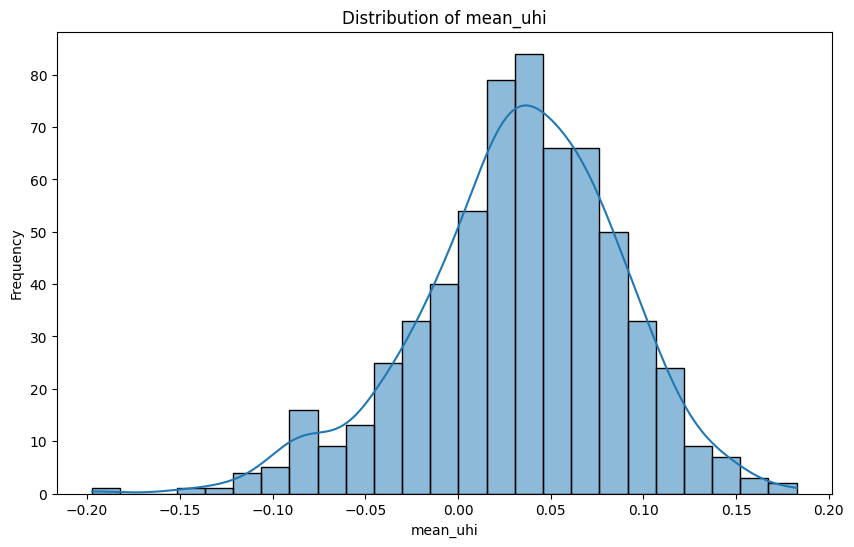

In [43]:
# Histogram Dependent Variable

plt.figure(figsize=(10, 6))
sns.histplot(normalized_df['mean_uhi'], kde=True)
plt.title('Distribution of mean_uhi')
plt.xlabel('mean_uhi')
plt.ylabel('Frequency')
plt.show()


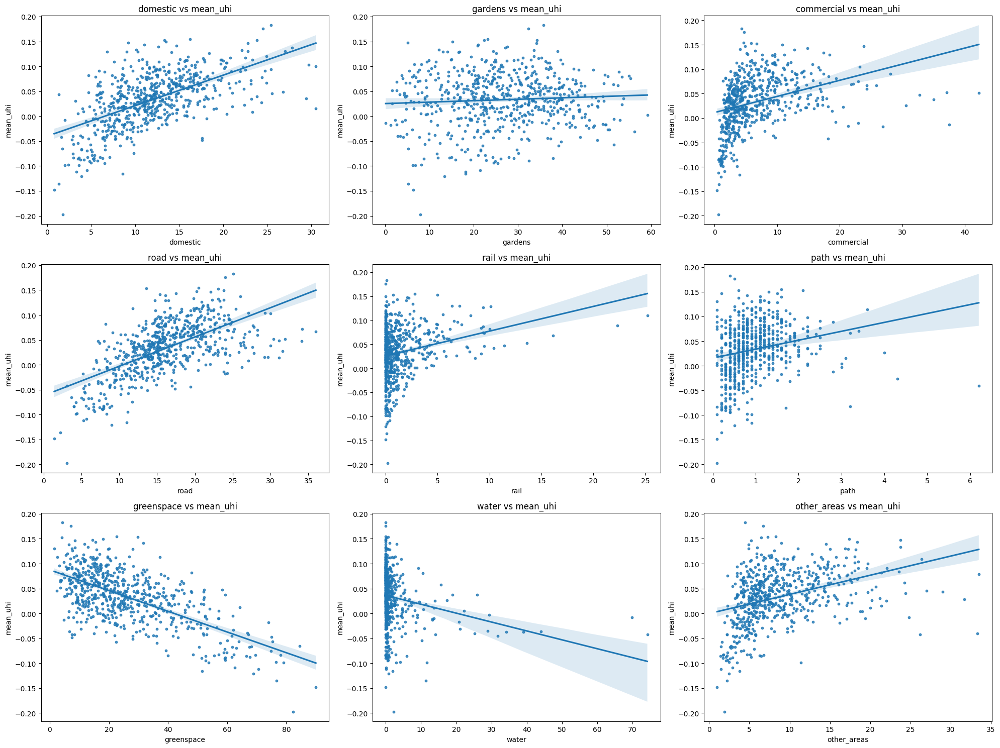

In [44]:
# Plot Dependent vs Independent

# Each dependent variable
variables = ['domestic', 'gardens', 'commercial','road', 'rail', 'path', 'greenspace', 'water','other_areas']

# Melt the DataFrame for plotting
melted_df = normalized_df.melt(id_vars=['GSS_CODE', 'geometry', 'Normalized NAME', 'Normalized Borough Name', 'mean_uhi'], 
                          value_vars=variables, 
                          var_name='Variable', 
                          value_name='Value')

# Create a violin plot for each independent variable against mean_uhi
plt.figure(figsize=(20, 15))

for i, column in enumerate(variables, 1):
    plt.subplot(3, 3, i)  # Create a 3x4 grid of subplots
    sns.regplot(x=normalized_df[column], y=normalized_df['mean_uhi'], scatter_kws={'s':10})
    plt.title(f'{column} vs mean_uhi')
    plt.xlabel(column)
    plt.ylabel('mean_uhi')

plt.tight_layout()

plt.show()

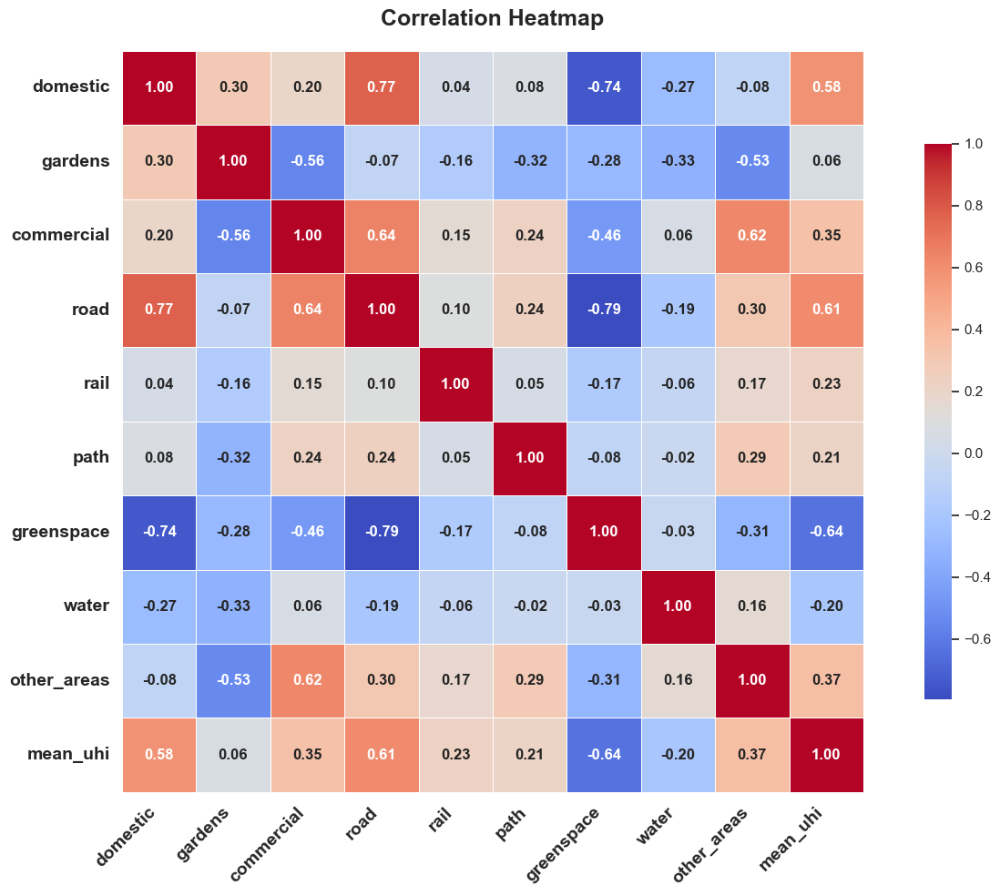

In [45]:
# Compute the correlation matrix
corr = normalized_df[numeric_columns].corr()

# Plot the correlation heatmap
plt.figure(figsize=(14, 10))
sns.set_theme(style="whitegrid")
heatmap = sns.heatmap(
    corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5, 
    cbar_kws={"shrink": .75}, square=True, 
    annot_kws={"size": 12, "fontweight": 'bold'}
)
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=14, fontweight='bold')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=14, fontweight='bold')
plt.title('Correlation Heatmap', fontsize=18, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

In [46]:
# Regression
import statsmodels.api as sm

# # Select relevant columns for regression from Coorelation Analysis
# 'Area of Domestic Buildings', 'Area of Non Domestic Buildings', 'Area of Road', 'Area of Rail', 
# 'Area of Path', 'Area of Greenspace', 'Area of Water', 'Area of Other Land Uses', 'hectares'

# Prepare the data
X = normalized_df[numeric_columns].drop('mean_uhi', axis=1)
y = normalized_df['mean_uhi']

# Add a constant to the model (intercept)
X = sm.add_constant(X)

# Fit the regression model
model = sm.OLS(y, X).fit()

# Print the summary of the regression
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               mean_uhi   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.558
Method:                 Least Squares   F-statistic:                     88.39
Date:                Tue, 03 Sep 2024   Prob (F-statistic):          8.61e-105
Time:                        20:02:16   Log-Likelihood:                 1195.7
No. Observations:                 625   AIC:                            -2371.
Df Residuals:                     615   BIC:                            -2327.
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.7863      1.707      0.461      0.645      -2.566       4.139
domestic       -0.0043      0.017     -0.254      0.800      -0.038       0.029
gardens        -0.0081      0.017     -0.476      0.634      -0.042       0.025
commercial     -0.0092      0.017     -0.542      0.588      -0.043       0.024
road           -0.0078      0.017     -0.458      0.647      -0.041       0.026
rail           -0.0056      0.017     -0.329      0.742      -0.039       0.028
path           -0.0021      0.017     -0.119      0.905      -0.036       0.032
greenspace     -0.0090      0.017     -0.527      0.598      -0.043       0.025
water          -0.0094      0.017     -0.552      0.581      -0.043       0.024
other_areas    -0.0043      0.017     -0.255      0.799      -0.038       0.029
==============================================================================
Omnibus:                        1.067   Durbin-Watson:                   1.231
Prob(Omnibus):                  0.586   Jarque-Bera (JB):                1.142
Skew:                          -0.094   Prob(JB):                        0.565
Kurtosis:                       2.909   Cond. No.                     5.25e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.25e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [47]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd


# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

vif_data

,feature,VIF
0,const,1.404765e+06
1,domestic,3.741551e+03
2,gardens,2.049318e+04
3,commercial,4.522419e+03
4,road,4.488843e+03
5,rail,8.365010e+02
6,path,5.924340e+01
7,greenspace,3.869850e+04
8,water,5.187339e+03
9,other_areas,3.713067e+03


In [48]:
# Dropping first variable with high VIF (Area of Gardens)
X = X.drop(['gardens'], axis=1)

# Recalculate VIF after dropping high VIF variables
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


       feature        VIF
0        const  96.490783
1     domestic   5.378838
2   commercial   3.402567
3         road   7.838825
4         rail   1.077136
5         path   1.201970
6   greenspace   4.512096
7        water   1.350093
8  other_areas   2.152558


In [49]:
# Dropping first variable with high VIF (Area of Road)
X = X.drop(['road' ], axis=1)

# Recalculate VIF after dropping high VIF variables
vif_data = pd.DataFrame()
vif_data["feature"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

       feature        VIF
0        const  75.084831
1     domestic   3.724052
2   commercial   1.904599
3         rail   1.067807
4         path   1.144142
5   greenspace   3.990035
6        water   1.270919
7  other_areas   2.149961


In [50]:
#Refit the model

# Fit the model with the adjusted X
model = sm.OLS(y, X).fit()

# Print the summary of the model
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:               mean_uhi   R-squared:                       0.564
Model:                            OLS   Adj. R-squared:                  0.559
Method:                 Least Squares   F-statistic:                     113.9
Date:                Tue, 03 Sep 2024   Prob (F-statistic):          9.24e-107
Time:                        20:02:17   Log-Likelihood:                 1195.5
No. Observations:                 625   AIC:                            -2375.
Df Residuals:                     617   BIC:                            -2340.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          -0.0231      0.012     -1.850      0.065      -0.048       0.001
domestic        0.0039      0.001      7.329      0.000       0.003       0.005
commercial     -0.0010      0.000     -2.848      0.005      -0.002      -0.000
rail            0.0025      0.001      4.067      0.000       0.001       0.004
path            0.0063      0.002      2.632      0.009       0.002       0.011
greenspace     -0.0009      0.000     -5.224      0.000      -0.001      -0.001
water          -0.0013      0.000     -4.995      0.000      -0.002      -0.001
other_areas     0.0038      0.000      9.180      0.000       0.003       0.005
==============================================================================
Omnibus:                        1.088   Durbin-Watson:                   1.234
Prob(Omnibus):                  0.580   Jarque-Bera (JB):                1.162
Skew:                          -0.096   Prob(JB):                        0.559
Kurtosis:                       2.910   Cond. No.                         290.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

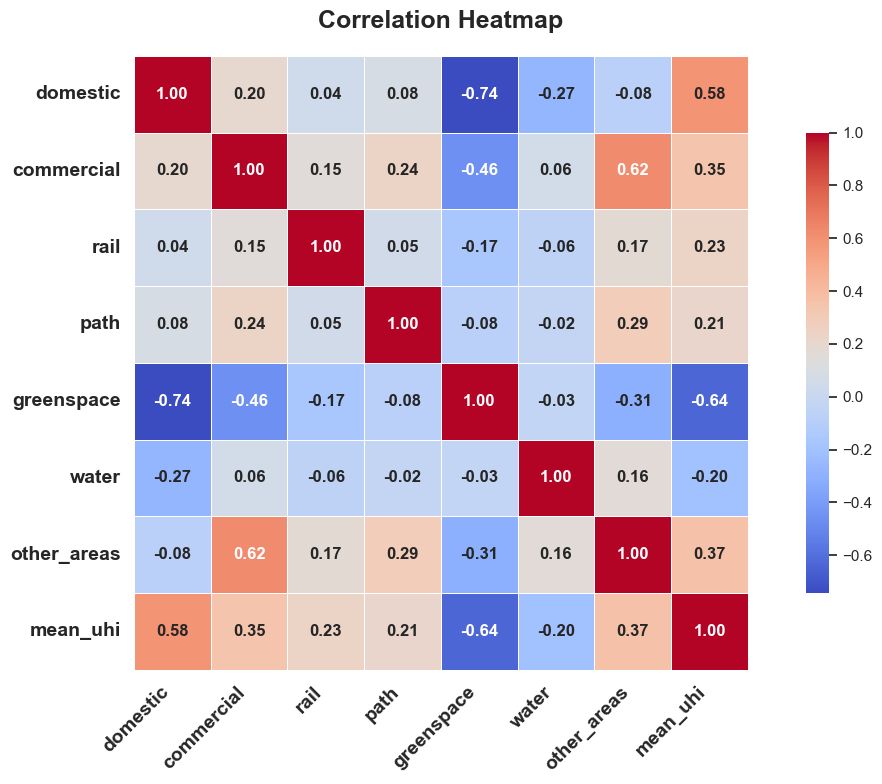

In [51]:
# Correlation Heatmap after VIF Analysis
final_columns = [
    'domestic',
    'commercial',
    'rail',
    'path',
    'greenspace',
    'water',
    'other_areas',
    'mean_uhi'
]

corr_df = normalized_df[final_columns]
plt.figure(figsize=(12, 8))
corr = corr_df.corr()
sns.set_theme(style="whitegrid")
heatmap = sns.heatmap(
    corr, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5, 
    cbar_kws={"shrink": .75}, square=True, 
    annot_kws={"size": 12, "fontweight": 'bold'}
)
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=14, fontweight='bold')
heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=14, fontweight='bold')
plt.title('Correlation Heatmap', fontsize=18, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

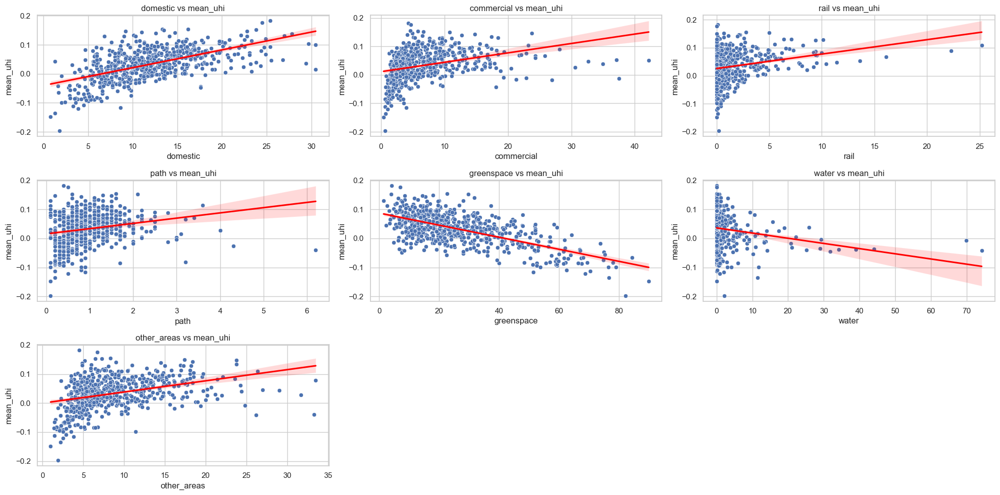

In [52]:
# Scatter plots with trend lines after VIF Analysis for remaining independent variables
plt.figure(figsize=(20, 10))

# Plot each variable against mean_uhi
for i, column in enumerate(final_columns[:-1], 1):
    plt.subplot(3, 3, i)
    sns.scatterplot(data=normalized_df, x=column, y='mean_uhi')
    sns.regplot(data=normalized_df, x=column, y='mean_uhi', scatter=False, color='red')
    plt.title(f'{column} vs mean_uhi')

plt.tight_layout()
plt.show()


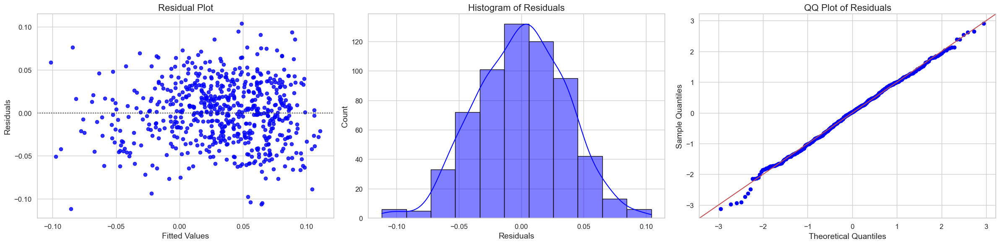

In [53]:
# Plot Residuals & QQ-Plot

# Create a figure with three subplots side by side
fig, axs = plt.subplots(1, 3, figsize=(24, 6))

# Residual plot without the red lowess line
sns.residplot(x=model.fittedvalues, y=model.resid, color='blue', lowess=False, ax=axs[0])
axs[0].set_xlabel('Fitted Values', fontsize=14)
axs[0].set_ylabel('Residuals', fontsize=14)
axs[0].set_title('Residual Plot', fontsize=16)
axs[0].tick_params(axis='both', which='major', labelsize=12)

# Histogram of residuals with better styling
sns.histplot(model.resid, kde=True, color='blue', edgecolor='black', binwidth=0.02, ax=axs[1])
axs[1].set_xlabel('Residuals', fontsize=14)
axs[1].set_ylabel('Count', fontsize=14)
axs[1].set_title('Histogram of Residuals', fontsize=16)
axs[1].tick_params(axis='both', which='major', labelsize=12)
axs[1].grid(True)

# QQ plot of residuals
sm.qqplot(model.resid, fit=True, line="45", ax=axs[2], markerfacecolor='blue', markeredgecolor='blue')
axs[2].set_title('QQ Plot of Residuals', fontsize=16)
axs[2].tick_params(axis='both', which='major', labelsize=12)
axs[2].set_xlabel('Theoretical Quantiles', fontsize=14)
axs[2].set_ylabel('Sample Quantiles', fontsize=14)
axs[2].grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

Symmetry: The residuals appear to be symmetrically distributed around zero, indicating that the model does not consistently overestimate or underestimate the mean UHI.

Normality: The histogram of residuals resembles a bell curve, suggesting that the residuals are approximately normally distributed. This is a good indication because one of the assumptions of OLS regression is that the residuals are normally distributed.

Centering: The peak of the histogram is centered around zero, which further supports that the model's predictions are unbiased on average.

Spread: The spread of the residuals is moderate, suggesting that the model has a reasonable level of prediction accuracy, although there are some deviations.